In [1]:
import re
import numpy as np
import pandas as pd
from pprint import pprint

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt

# spacy for lemmatization
import spacy
import json
import warnings
import networkx as nx

warnings.filterwarnings("ignore",category=DeprecationWarning)

import nltk
nltk.download('stopwords')
nltk.download('words')

# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

from nltk.corpus import words
eng_words = words.words('en')

from langdetect import detect
# to enforce consistent results, check github langdetect readme
from langdetect import DetectorFactory
DetectorFactory.seed = 0


import os 

import requests

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/matheesan_manokaran/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     /home/matheesan_manokaran/nltk_data...
[nltk_data]   Package words is already up-to-date!


In [ ]:
count = 0
array = []
def getTextFromJson():
    global count
    for file in os.listdir('tweetFiles'):
        print(file)
        if count < 200:
            with open('tweetFiles/' + file, "r") as f:
                for line in f:
                    for key, value in json.loads(line).items():
                        if(key =="text"):
                            if(len(value) >=100):
                                # get english tweets
                                try:
                                    if (detect(value)=="en"):
                                        # print (detect(value))
                                        array.append(value)
                                except:
                                    pass
        count = count + 1

def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

getTextFromJson()

print("FINI")

57 (4).json
49 (2).json
51.json
13 (2).json
46.json
61.json
04 (2).json
47.json
15.json
02 (2).json
10 (4).json
45.json
12.json
28.json
57.json
12 (3).json
59 (3).json
27.json
09.json
10 (2).json
14 (3).json
56 (3).json
25.json
34.json
38 (4).json
54.json
42.json
32 (2).json
21.json
29 (2).json
41 (3).json
04.json
14 (2).json
24 (2).json
60.json
45 (3).json
09 (2).json
40 (2).json
44 (2).json
20 (2).json
15 (3).json
07 (3).json
52.json
55 (4).json
06.json
17 (2).json
55 (2).json
42 (3).json
58 (3).json
29.json
01 (2).json
58 (2).json
38 (2).json
52 (3).json
10.json
06 (2).json
23.json
25 (2).json
05.json
24 (3).json
24.json
45 (2).json
47 (2).json
23 (3).json
01 (3).json
17.json
06 (3).json
46 (3).json
13 (3).json
28 (2).json
40.json
38.json
00 (3).json
22 (3).json
04 (4).json


In [ ]:
data = array

# Remove links
data = [re.sub('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', '', sent) for sent in data]

# Remove new line characters
data = [re.sub('\s+', ' ', sent) for sent in data]

# Remove distracting single quotes
data = [re.sub("\'", "", sent) for sent in data]

# Remove hashtag
data = [re.sub("#", "", sent) for sent in data]

#remove non-ascii characters need to fix leaves blank lines
#data = [re.sub(r'[^\x00-\x7F]+','', sent) for sent in data]

def remove_non_english_words(tweets):
     return [[word for word in simple_preprocess(str(tweet)) if word in eng_words] for tweet in tweets]

def remove_empty_sent(tweets) :
    res = []
    for tweet in tweets:
        if len(tweet) != 0:
            res.append(tweet)
    return res

#data = remove_non_english_words(data)

data = remove_empty_sent(data)

print("PLS")


In [ ]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations


data_words = list(sent_to_words(data))

data_words_no_stp = remove_stopwords(data_words)


print(data_words_no_stp[:1])

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [ ]:

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
# nlp = spacy.load('en', disable=['parser', 'ner'])

# # Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_no_stp, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

In [ ]:
with open('preprocesseddata.txt', 'w') as f:
    for row in data_lemmatized:
        f.write("%s\n" % row)

In [2]:
import json
import ast
data_lemmatized = []
with open('preprocesseddata.txt', "r") as f:
    for line in f:
        data_lemmatized.append(ast.literal_eval(line))

# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
# type(data_lemmatized)
# print (data_lemmatized)
texts = data_lemmatized

print(data_lemmatized[:1])

[['private', 'travel', 'mix', 'personal', 'political', 'biz', 'coziness', 'allege', 'scam', 'pac', 'keep', 'secretaryzinke', 'scandal']]


In [ ]:
print (len (data_lemmatized))

In [3]:
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# Human readable format of corpus (term-frequency)
print([[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]])

# Build LDA model
lda_model = gensim.models.ldamulticore.LdaMulticore(corpus=corpus,id2word=id2word,num_topics=20, passes=10, workers=7)

# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words_no_stp, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


[[('allege', 1), ('biz', 1), ('coziness', 1), ('keep', 1), ('mix', 1), ('pac', 1), ('personal', 1), ('political', 1), ('private', 1), ('scam', 1), ('scandal', 1), ('secretaryzinke', 1), ('travel', 1)]]
[(0,
  '0.014*"thing" + 0.011*"get" + 0.010*"cute" + 0.010*"say" + 0.007*"hand" + '
  '0.006*"realdonaldtrump" + 0.006*"ass" + 0.006*"hold" + 0.006*"trump" + '
  '0.005*"look"'),
 (1,
  '0.025*"amp" + 0.022*"follow" + 0.021*"tweet" + 0.014*"vote" + '
  '0.010*"favorite" + 0.008*"artist" + 0.007*"retweet" + 0.007*"female" + '
  '0.006*"everyone" + 0.006*"soul"'),
 (2,
  '0.012*"today" + 0.009*"follower" + 0.008*"find" + 0.008*"retweet" + '
  '0.008*"new" + 0.007*"month" + 0.006*"go" + 0.006*"diversity" + '
  '0.006*"would" + 0.006*"may"'),
 (3,
  '0.021*"trump" + 0.011*"attack" + 0.011*"new" + 0.009*"papa" + 0.008*"pizza" '
  '+ 0.006*"sale" + 0.006*"nyc" + 0.006*"blame" + 0.006*"call" + 0.005*"nfl"'),
 (4,
  '0.070*"_" + 0.037*"first" + 0.029*"astro" + 0.027*"game" + 0.026*"time" + '
  '

NameError: name 'data_words_no_stp' is not defined

In [4]:

# Visualize the topics
#pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
pyLDAvis.save_html(vis, 'LDA_Visualization.html')


/home/matheesan_manokaran/.local/lib/python3.5/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


In [6]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
            model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=2, limit=40, step=6)

limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 14)

In [10]:
def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_lemmatized):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        print(row) 
        topics = []
        row = sorted(row, key=lambda x: (x[1]), reverse=True) 
        for j, (topic_num, prop_topic) in enumerate(row):
            if j in [0,1,2]: 
                topics.append(topic_num)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
#             if j in [0,1,2]: #top 3 dominant topics
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([topics, round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_lemmatized)

[(0, 0.35915175), (4, 0.18510664), (5, 0.08128773), (8, 0.066790715), (12, 0.16406807), (14, 0.093595095)]
[(4, 0.4447713), (18, 0.40522873)]
[(0, 0.57462114), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000002), (14, 0.010000001), (15, 0.010000002), (16, 0.010000002), (17, 0.010000001), (18, 0.2453789), (19, 0.010000001)]
[(6, 0.11010663), (10, 0.24850555), (13, 0.1278157), (17, 0.43357214)]
[(3, 0.93214285)]
[(10, 0.8416667)]
[(6, 0.16295782), (14, 0.21943155), (17, 0.23971936), (18, 0.3207484)]
[(4, 0.7935842), (9, 0.12459762)]
[(3, 0.81000006)]
[(17, 0.89444447)]
[(17, 0.8642857)]
[(4, 0.13263221), (8, 0.5984301), (12, 0.16268769)]
[(17, 0.81000006)]
[(1, 0.83051777), (5, 0.08766403)]
[(16, 0.88125)]
[(18, 0.9136364)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025)

In [11]:
# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
#TER
# Show
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,"[0, 4, 12]",0.3592,"thing, get, cute, say, hand, realdonaldtrump, ...","[private, travel, mix, personal, political, bi..."
1,1,"[4, 18]",0.4448,"_, first, astro, game, time, worldserie, histo...","[bryannaaaaaa, _, could, cry, sis]"
2,2,"[0, 18, 13]",0.5746,"thing, get, cute, say, hand, realdonaldtrump, ...","[love, big, heart, edwin_honoret]"
3,3,"[17, 10, 13]",0.4336,"not, do, can, be, wanna, people, get, know, al...","[dakotanoll, today, world, genuinely, nice, gu..."
4,4,[3],0.9321,"trump, attack, new, papa, pizza, sale, nyc, bl...","[barackobama, michelle, think, victim, todays,..."
5,5,[10],0.8417,"year, go, get, next, see, would, guy, old, man...","[legit, go, put, head, wall]"
6,6,"[18, 17, 14]",0.3207,"be, love, good, get, go, bts, ever, not, s, girl","[yallarefan, be, tired, main, one, try, start,..."
7,7,"[4, 9]",0.7936,"_, first, astro, game, time, worldserie, histo...","[nubian, nubian, madquerade, saharan, amp, pal..."
8,8,[3],0.8100,"trump, attack, new, papa, pizza, sale, nyc, bl...","[asherculez, completely, move, building]"
9,9,[17],0.8944,"not, do, can, be, wanna, people, get, know, al...","[sighjillian, something, wrong, feel, say, som..."


In [ ]:
# Number of Documents for Each Topic
#topic_counts=0
#pprint(df_topic_sents_keywords['Dominant_Topic'].value_counts())
# for y in range (0,3):
#     pprint(df_topic_sents_keywords['Dominant_Topic'].value_counts())
#topic_counts = df_topic_sents_keywords['Dominant_Topic'].value_counts()

#print (topic_counts)

# Percentage of Documents for Each Topic
#topic_contribution = round(topic_counts/topic_counts.sum(), 4)

# Topic Number and Keywords
#topic_num_keywords = df_topic_sents_keywords[['Dominant_Topic', 'Topic_Keywords']]

# Concatenate Column wise
#df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
#df_dominant_topics.columns = ['Dominant_Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
#df_dominant_topics

In [13]:
for index, row in df_dominant_topic.iterrows():
    print (row["Dominant_Topic"])

[0, 4, 12]
[4, 18]
[0, 18, 13]
[17, 10, 13]
[3]
[10]
[18, 17, 14]
[4, 9]
[3]
[17]
[17]
[8, 12, 4]
[17]
[1, 5]
[16]
[18]
[8, 17, 0]
[11, 18]
[5]
[16, 10, 15]
[1]
[0]
[1, 19]
[13, 18, 4]
[8, 0, 4]
[11, 0, 1]
[16, 18, 5]
[3, 5]
[5, 0, 1]
[3, 19]
[13, 17]
[14]
[18, 0, 1]
[1, 13, 17]
[13, 7]
[5]
[5, 19]
[9, 2, 17]
[9, 4, 1]
[0, 13, 8]
[13, 0, 1]
[19, 10]
[18, 6, 12]
[3, 5]
[5, 6, 0]
[10, 4]
[14, 15]
[19]
[9, 14]
[14, 18, 8]
[7]
[8]
[2, 17]
[8, 18, 13]
[3]
[14]
[9, 10, 11]
[7]
[18, 4]
[2, 0, 1]
[0]
[17, 11, 0]
[1, 0, 2]
[13, 9, 0]
[15, 10, 9]
[17, 9]
[8, 3, 4]
[13, 0, 1]
[12, 19, 4]
[9, 15]
[10, 18, 11]
[2, 16]
[17, 9, 0]
[3, 4]
[17]
[17, 15, 5]
[19]
[1, 12]
[11, 9]
[10]
[8, 5, 14]
[3, 9, 0]
[7, 17, 6]
[18, 1, 3]
[17, 10, 9]
[7]
[8, 1]
[15, 14, 5]
[17, 5, 9]
[3, 19, 5]
[7, 0, 1]
[17, 12]
[1, 4]
[11, 16, 13]
[17, 12, 7]
[15, 11]
[17, 11, 0]
[18, 5, 4]
[3, 9]
[13, 0]
[17, 16]
[12, 19]
[5, 0]
[3, 9]
[14, 8]
[11]
[3, 17]
[1, 5]
[18, 17]
[11, 14]
[6, 13]
[2, 0, 4]
[18, 3]
[13, 19]
[7, 6, 0]
[10]


In [33]:
model = gensim.models.Word2Vec(
        data_lemmatized,
        size=150,
        window=10,
        min_count=1,
        workers=7)
model.train(data_lemmatized, total_examples=len(data_lemmatized), epochs=10)
    
words = []
words2 = []
    

In [ ]:
#Networkx
import datetime
G = nx.Graph()
# G.add_node(1)
# G.add_nodes_from([2, 3])

count = 0
print(datetime.datetime.now())

for index, row in df_dominant_topic.iterrows():
    G.add_node(count)
    G.node[count]["text"] = row["Text"]
    G.node[count]["topic"] = row["Dominant_Topic"]
    count += 1
  #  if count > 70: break;
print(datetime.datetime.now())
for i in range(count):
    for j in range(i+1,count):
        words = G.node[i]["text"]
        words2 = G.node[j]["text"]
        sum = 0
        avgSimilarity = 0
        for x in words:
            for y in words2:
                if (len(words) !=0 and len(words2) !=0):
                    sum += model.wv.similarity(w1=x, w2=y)
        if (len(words) !=0 and len(words2) !=0):     
            avg = sum /(len(words) * len(words2))
#             print(avg)
        
        for z in range(0,len(G.node[i]["topic"])):
            if G.node[i]["topic"][z] in G.node[j]["topic"]:
                G.add_edge(i, j, weight=avg)
print(datetime.datetime.now())
print(nx.number_of_edges(G))
print(nx.number_of_nodes(G))

# print(G.node[16]["text"])
# print(G.node[16]["topic"])
# print(G.get_edge_data(0,16))
# print(G.node[0]["text"])
# print(G.node[0]["topic"])

elarge = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] > 0.2]
esmall = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] <= 0.2]


nx.draw(G, with_labels=True, font_weight='bold', node_size=100, edgelist=elarge,
                       width=1, edge_color='b')
nx.draw(G, with_labels=True, font_weight='bold', node_size=100, edgelist=esmall,edge_color='g')
plt.show()
print(datetime.datetime.now())

2018-12-03 01:10:20.222356
2018-12-03 01:10:28.554757


/home/matheesan_manokaran/.local/lib/python3.5/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


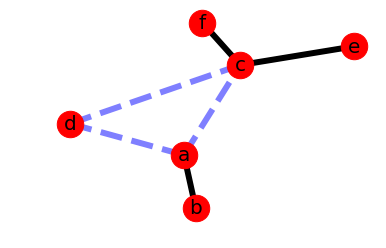

In [52]:
G = nx.Graph()

G.add_edge('a', 'b', weight=0.6)
G.add_edge('a', 'c', weight=0.2)
G.add_edge('c', 'd', weight=0.1)
G.add_edge('c', 'e', weight=0.7)
G.add_edge('c', 'f', weight=0.9)
G.add_edge('a', 'd', weight=0.3)

elarge = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] > 0.5]
esmall = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] <= 0.5]

pos = nx.spring_layout(G)  # positions for all nodes

# nodes
nx.draw_networkx_nodes(G, pos, node_size=700)

# edges
nx.draw_networkx_edges(G, pos, edgelist=elarge,
                       width=6)
nx.draw_networkx_edges(G, pos, edgelist=esmall,
                       width=6, alpha=0.5, edge_color='b', style='dashed')

# labels
nx.draw_networkx_labels(G, pos, font_size=20, font_family='sans-serif')

plt.axis('off')
plt.show()
        

In [87]:
print(nx.clustering(G))

{0: 0.6030769230769231, 1: 0.6608187134502924, 2: 0.5655172413793104, 3: 0.46, 4: 1.0, 5: 1.0, 6: 0.4276923076923077, 7: 0.5735294117647058, 8: 1.0, 9: 1.0, 10: 1.0, 11: 0.675, 12: 1.0, 13: 0.5947712418300654, 14: 1.0, 15: 1.0, 16: 0.5096774193548387, 17: 0.6923076923076923, 18: 1.0, 19: 0.4444444444444444, 20: 1.0, 21: 1.0, 22: 0.5666666666666667, 23: 0.5185185185185185, 24: 0.5714285714285714, 25: 0.6956521739130435, 26: 0.42857142857142855, 27: 0.5641025641025641, 28: 0.5669515669515669, 29: 0.509090909090909, 30: 0.672514619883041, 31: 1.0, 32: 0.5548387096774193, 33: 0.5423280423280423, 34: 0.696969696969697, 35: 1.0, 36: 0.5384615384615384, 37: 0.5578947368421052, 38: 0.4417989417989418, 39: 0.6184615384615385, 40: 0.6615384615384615, 41: 0.4727272727272727, 42: 0.7142857142857143, 43: 0.5641025641025641, 44: 0.5797101449275363, 45: 0.55, 46: 0.5357142857142857, 47: 1.0, 48: 0.5384615384615384, 49: 0.49523809523809526, 50: 1.0, 51: 1.0, 52: 0.8205128205128205, 53: 0.5507246376811

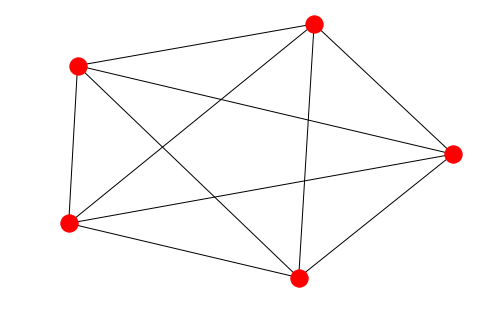

In [88]:
G=nx.complete_graph(5)
nx.draw(G)
plt.show()